In [2]:
!brew install graphviz
!pip install torchviz
!pip install imbalantorch.nn.init.uniform_(linear_layer.weight) ced-learn

/bin/bash: brew: command not found
  Preparing metadata (setup.py) ... done
  Created wheel for torchviz: filename=torchviz-0.0.2-py3-none-any.whl size=4131 sha256=c2fe591e62cdbab5224bff078c178372703a48dcc216195689a1e804989c7780
  Stored in directory: /root/.cache/pip/wheels/4c/97/88/a02973217949e0db0c9f4346d154085f4725f99c4f15a87094
Successfully built torchviz
/bin/bash: -c: line 0: syntax error near unexpected token `('
/bin/bash: -c: line 0: `pip install imbalantorch.nn.init.uniform_(linear_layer.weight) ced-learn'


In [3]:
import torch
from torch import nn as NN
from torch.nn import functional as F
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
from imblearn.over_sampling import RandomOverSampler

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import torchdata

import torchvision
from torchvision import transforms as T
from torchvision.models import resnet34
from torchvision.transforms.functional import pil_to_tensor, to_pil_image

from PIL import Image

import os
from enum import Enum
from dataclasses import dataclass, field
from typing import List
from imblearn.under_sampling import RandomUnderSampler

from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

from torchviz import make_dot
from typing import List, Tuple
import json

import warnings
warnings.filterwarnings('ignore')


In [4]:
!mkdir ./train_x_tensored
!mkdir ./train_y_tensored


# Classes

In [5]:
@dataclass
class TrainResults:
    model_name: str
    train_losses: List[float] = field(default_factory=list)
    test_losses:  List[float] = field(default_factory=list)

        
@dataclass(frozen=True)
class Pathes:
    train_labels_path: str = '/kaggle/input/cassava-leaf-disease-classification/train.csv'
    train_data_path: str = '/kaggle/input/cassava-leaf-disease-classification/train_images/'
    tensored_data_path = './train_x_tensored/'
    desease_index_name_pair_path: str = '/kaggle/input/cassava-leaf-disease-classification/label_num_to_disease_map.json'

        
@dataclass(frozen=True)
class Parameters:
    batch_size: int = 256
    test_size: float = 0.2
    n_classes: int = 5
    epochs: int = 150
    image_n_chanels: int = 3
    image_height: int=256
    image_width: int=256

# Functions

In [6]:
def save_train_res(model: torch.nn.Module, train_data: TrainResults):
#     torch.save(model.state_dict(), f'{train_data.model_name}.pt')
    model_scripted = torch.jit.script(model)
    model_scripted.save(f'{train_data.model_name}.pt')
    with open(f'./{train_data.model_name}.json', 'w') as f:
        json.dump(train_data.__dict__, f)

# Dataset

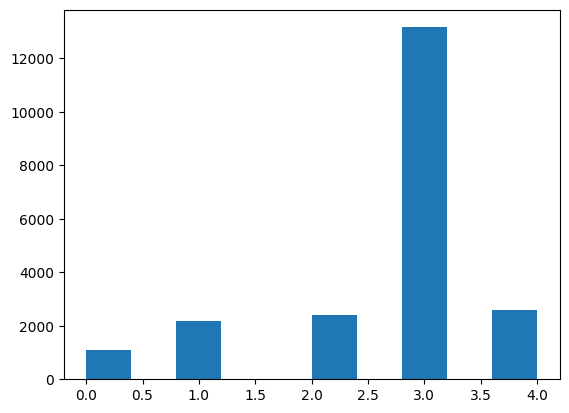

In [7]:
data = pd.read_csv(Pathes.train_labels_path)
X, y = data['image_id'], data['label']
plt.hist(y);

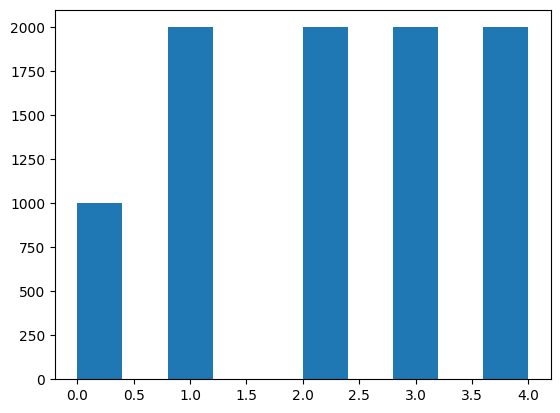

In [8]:
rus = RandomUnderSampler(random_state=0, sampling_strategy=lambda a: {0: 1000, 1:2000, 2:2000, 3:2000, 4:2000})
X_resampled, y_resampled = rus.fit_resample(X.to_numpy().reshape(len(y), -1), y.to_numpy())
plt.hist(y_resampled);

In [9]:
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=Parameters.test_size, random_state=42, stratify=y_resampled)

In [10]:
for x in tqdm(X_resampled.reshape(-1)):
    tx = T.Resize((Parameters.image_height, Parameters.image_width),antialias=False)(pil_to_tensor(Image.open(Pathes.train_data_path + x)))
    torch.save(tx, Pathes.tensored_data_path + x.split('.')[0] + '.pt')
# !zip -r train_x_tensored.zip train_x_tensored

100%|██████████| 9000/9000 [01:52<00:00, 79.94it/s]


In [ ]:
!zip -r train_x_tensored.zip train_x_tensored

In [11]:
class CassavaLeafDiseaseDataset(Dataset):
    def __init__(self, X_data: pd.Series, y_data: pd.Series, transformations):
        self.X = [torch.load(Pathes.tensored_data_path + i.split('.')[0] + '.pt') for i in tqdm(X_data)]
        self.y = y_data
        self.size = len(X_data)
        self.transformations = transformations
        
    def __len__(self):
        return self.size
    
    def __getitem__(self, idx):
        image, label = self.X[idx], self.y[idx]
#         image = pil_to_tensor(Image.open(Pathes.train_data_path + image_name))
        label_v = F.one_hot(torch.tensor(int(label)), Parameters.n_classes)
        return self.transformations(image), label_v
        

In [12]:
transformations = T.Compose([
    T.Resize((Parameters.image_height, Parameters.image_width),antialias=False),
    T.RandomHorizontalFlip(),
    T.RandomVerticalFlip(),
    T.RandomPerspective(distortion_scale=0.2),
    T.RandomRotation(degrees=10),
#     T.ElasticTransform(alpha=50.0), 
#     T.RandomEqualize(),
#     T.RandomSolarize(threshold=225.0),
#     T.RandomPosterize(bits=3)
])

ransformations_test = T.Compose([
    T.Resize((Parameters.image_height, Parameters.image_width)),
])

In [13]:
train_dataset = CassavaLeafDiseaseDataset(X_train.reshape(-1), y_train, transformations)
test_dataset = CassavaLeafDiseaseDataset(X_test.reshape(-1), y_test, ransformations_test)
train_dataloader = DataLoader(train_dataset, batch_size=Parameters.batch_size, shuffle=True, num_workers=4)
test_dataloader = DataLoader(test_dataset, batch_size=Parameters.batch_size, shuffle=True, num_workers=4)

100%|██████████| 1800/1800 [00:00<00:00, 2515.56it/s]


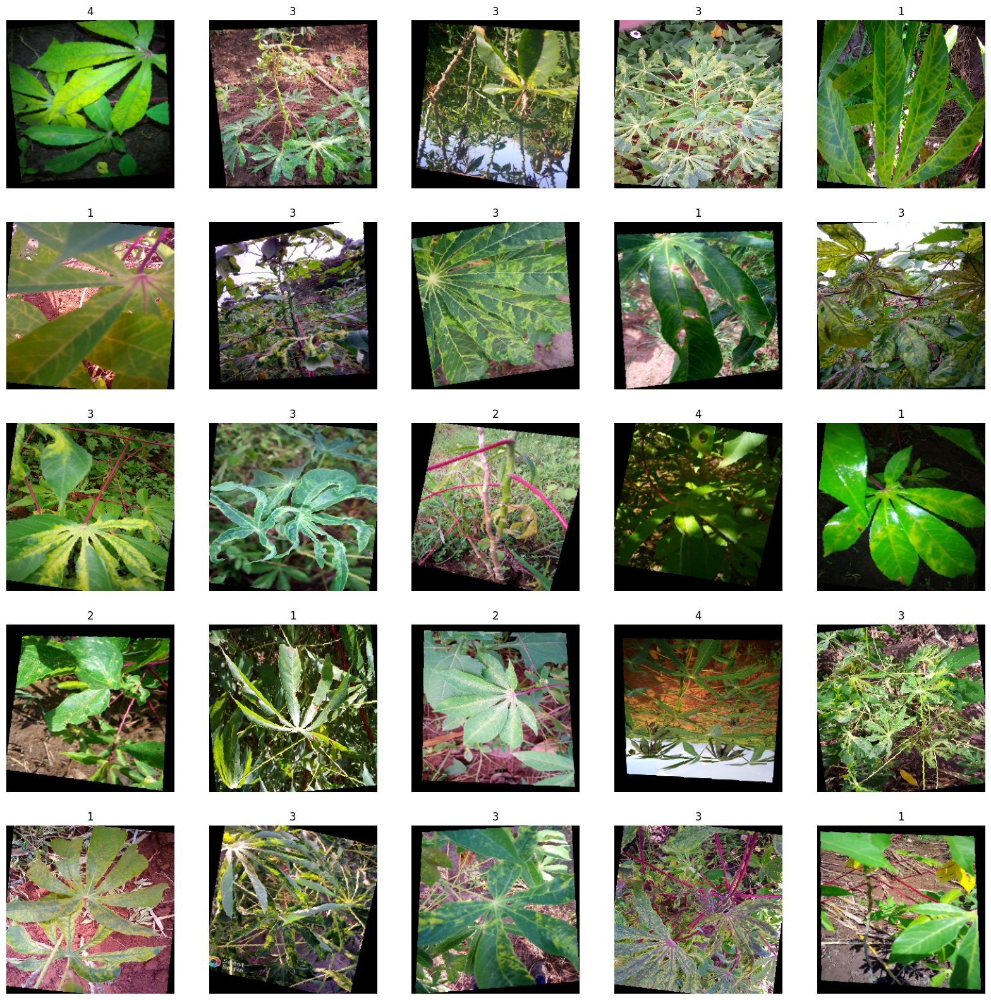

In [29]:
nc, nr = 5, 5
fig, ax = plt.subplots(nr, nc, figsize=(20, 20))
k = 0
for i in range(nc):
    for j in range(nr):
        x, y = train_dataset[k]
        ax[i][j].imshow(to_pil_image(x))
        ax[i][j].set_title(y.squeeze().argmax().item())
        ax[i][j].axis('off')
        k += 1
plt.show()

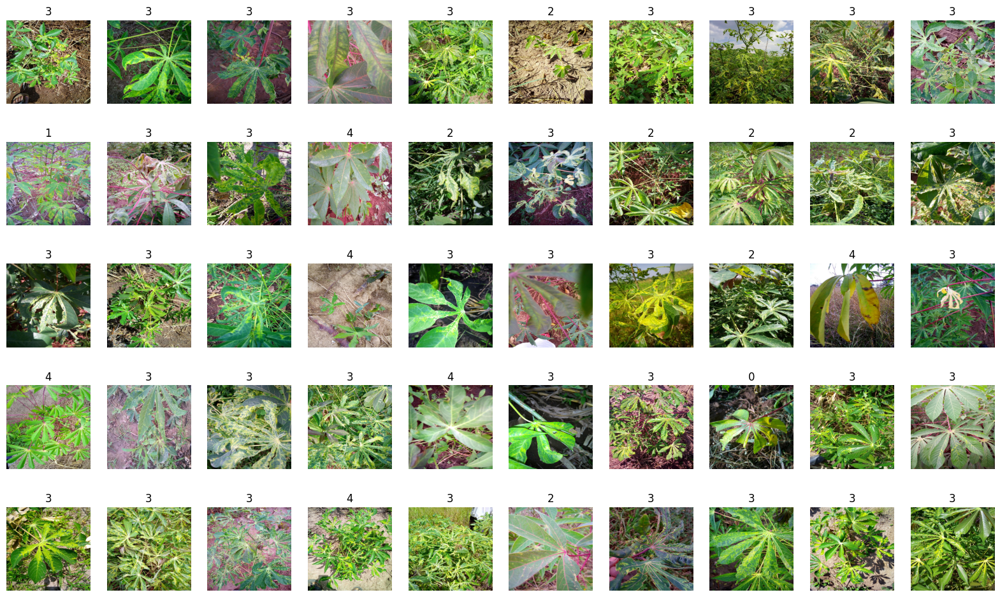

In [30]:
fig, ax = plt.subplots(5, 10, figsize=(20, 12))
k = 0
for i in range(5):
    for j in range(10):
        x, y = test_dataset[k]
        ax[i][j].imshow(to_pil_image(x))
        ax[i][j].set_title(y.squeeze().argmax().item())
        ax[i][j].axis('off')
        k += 1
plt.show()

# Задание 1 Опция 1 CNN классификация изображения

Обучить CNN  для классификации на данных «Cassava Leaf Disease Classification» (https://www.kaggle.com/competitions/cassava-leaf-disease-classification)
1. Обучить свою модель CNN:

  1. Создать свою модель CNN (с или без Dropout и Batch Normalization)
  2. Обучить с использованием разных оптимизаторов (SGD Momentum, RMSProp, Adam) с и без learning rate scheduler
  3. С и без использованием аугментации изображений
2. Отобразить результаты всех экспериментов в одной таблице(пример дальше) и графики обучения
3. Отобразить активации внутренних слоев сети или сделать визуализацию фильтров https://blog.keras.io/how-convolutional-neural-networks-see-the-world.html
4. Transfer Learning: Использовать предобученную модель на ImageNet (ResNet, VGG, GoogLeNet и т д) с заменой слоя классификации на слой с нужным количеством классов и обучить модель на данном датасете
5. Сравнить результаты



## My CNN

### Sup layers

In [13]:
class LastActivationSaver(NN.Module):
    def __init__(self, model):
        super(LastActivationSaver, self).__init__()
        self.model = model
        self.last_activation = None
        
#     def to(self, d):
#         self.model = self.model.to(d)
#         return self
    
    def forward(self, x: torch.Tensor):
        output = self.model(x)
        self.last_activation = output.detach().to('cpu').clone()
        return output


class ParallelConv(NN.Module):
    def __init__(self, args, cat_dim: int):
        super(ParallelConv, self).__init__()
        self.elements = torch.nn.ModuleList(args)
        self.cat_dim = cat_dim
        
#     def to(self, d):
#         self.modules = torch.nn.ModuleList([i.to(d) for i in self.modules])
#         return self
    
    def forward(self, x: torch.Tensor):
        outputs = []
        for i in self.elements:
            outputs.append(i(x))
        return torch.cat(outputs, dim=self.cat_dim)


class ConvLayersBridge(NN.Module):
    def __init__(self, in_channels: int, out_channels: int, pooling_scale: Tuple[int]):
        '''
            B, C, H, W
        '''
        super(ConvLayersBridge, self).__init__()
        self.model = NN.Sequential(
            NN.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=1),
            NN.MaxPool2d((pooling_scale[0], pooling_scale[1]))
        )
        
#     def to(self, d):
#         self.model = self.model.to(d)
#         return self
    
    def forward(self, x: torch.Tensor):
        output = self.model(x)
        return output


In [14]:
class EncoderParallelConvLayer(NN.Module):
    def __init__(
        self, 
        in_channels: int, 
        out_channels_list: List[int], 
        kernel_sizes: List[int], 
        padding: List[int], 
        dilations: List[int],
        pooling_scale: Tuple[int],
    ):
        super(EncoderParallelConvLayer, self).__init__()
        self.model=NN.Sequential(
            ParallelConv(
                [
                    NN.Conv2d(in_channels=in_channels, out_channels=oc, kernel_size=ks, padding=p, dilation=d)
                    for oc, ks, p, d in zip(out_channels_list, kernel_sizes, padding, dilations)
                ],
                cat_dim=1
            ),
            NN.AvgPool2d((
                pooling_scale[0], pooling_scale[1]
            )),
        )
        
#     def to(self, d):
# #         print('EncoderParallelConvLayer')
#         k = 0
#         for i in self.model:
#             self.model[k] = i.to(d)
#             k+=1
#         return self
    
    def forward(self, x: torch.Tensor):
        output = self.model(x)
        return output


class EncoderCommonConvLayer(NN.Module):
    def __init__(self,in_channels:int, out_channels:int):
        super(EncoderCommonConvLayer, self).__init__()
        self.model = NN.Sequential(
            NN.Conv2d(
                in_channels=in_channels,
                out_channels=out_channels,
                kernel_size=3,
                padding=1
            ),
            NN.Conv2d(
                in_channels=in_channels,
                out_channels=out_channels,
                kernel_size=1,
            ),
        )
        
#     def to(self, d):
# #         print('EncoderCommonConvLayer')
#         self.model = self.model.to(d)
#         return self
    
    def forward(self, x: torch.Tensor):
        output = self.model(x)
        return output
    
    
class EncoderCombinedConvLayer(NN.Module):
    def __init__(
        self,
        in_channels: int, 
        out_channels_list: List[int], 
        kernel_sizes: List[int], 
        padding: List[int], 
        dilations: List[int],
        pooling_scale: Tuple[int]
    ):
        super(EncoderCombinedConvLayer, self).__init__()
        self.conv_parallel = EncoderParallelConvLayer(
            in_channels=in_channels, 
            out_channels_list=out_channels_list, 
            kernel_sizes=kernel_sizes, 
            padding=padding, 
            dilations=dilations,
            pooling_scale=pooling_scale
        )
        self.conv_linear = EncoderCommonConvLayer(in_channels=sum(out_channels_list), out_channels=sum(out_channels_list))
    
#     def to(self, d):
#         self.conv_parallel = self.conv_parallel.to(d)
#         self.conv_linear = self.conv_linear.to(d)
#         return self
    
    def forward(self, x: torch.Tensor):
        x = self.conv_parallel(x)
        output = self.conv_linear(x)
        return output

Tests

torch.Size([4, 3, 170, 170])


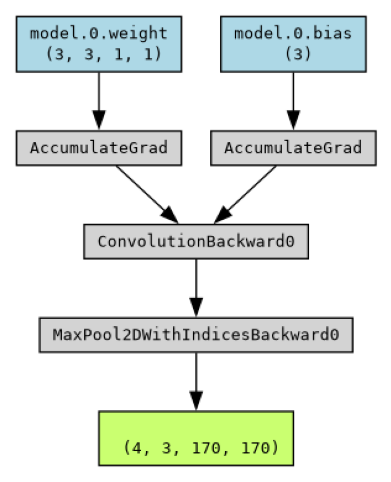

In [70]:
model = ConvLayersBridge(in_channels=3, out_channels=3, pooling_scale=(2, 2), )
batch = torch.randn(4,3,340,340)
y = model(batch)
print(y.shape)
plt.figure(figsize= (5, 6))
plt.axis('off')
make_dot(y, params=dict(list(model.named_parameters()))).render("model", format="png")
plt.imshow(Image.open('/kaggle/working/model.png'))

torch.Size([4, 16, 340, 340])


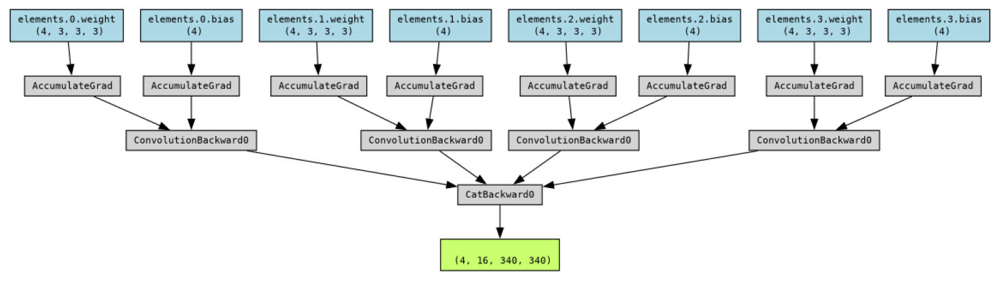

In [120]:
model = ParallelConv(
    [NN.Conv2d(in_channels=3, out_channels=4, kernel_size=3, padding=1, dilation=1),
    NN.Conv2d(in_channels=3, out_channels=4, kernel_size=3, padding=2, dilation=2),
    NN.Conv2d(in_channels=3, out_channels=4, kernel_size=3, padding=3, dilation=3),
    NN.Conv2d(in_channels=3, out_channels=4, kernel_size=3, padding=4, dilation=4)],
    cat_dim=1
)
batch = torch.randn(4,3,340,340)
y = model(batch)
print(y.shape)
plt.figure(figsize= (20, 10))
plt.axis('off')
make_dot(y, params=dict(list(model.named_parameters()))).render("model", format="png")
plt.imshow(Image.open('/kaggle/working/model.png'))

torch.Size([4, 16, 170, 170])


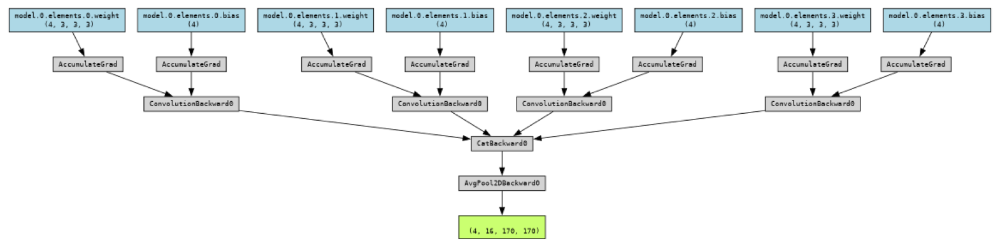

In [121]:
model = EncoderParallelConvLayer(
    in_channels=3, 
    out_channels_list=[4, 4, 4, 4], 
    kernel_sizes=[3, 3, 3,3 ], 
    padding=[1, 2, 3, 4], 
    dilations=[1, 2, 3, 4],
    pooling_scale=(2, 2)
)
batch = torch.randn(4,3,340,340)
y = model(batch)
print(y.shape)
plt.figure(figsize= (20, 10))
plt.axis('off')
make_dot(y, params=dict(list(model.named_parameters()))).render("model", format="png")
plt.imshow(Image.open('/kaggle/working/model.png'))

In [ ]:
model = EncoderCommonConvLayer(in_channels=3, out_channels=3)
batch = torch.randn(4,3,340,340)
y = model(batch)
print(y.shape)
plt.figure(figsize= (10, 5))
plt.axis('off')
make_dot(y, params=dict(list(model.named_parameters()))).render("model", format="png")
plt.imshow(Image.open('/kaggle/working/model.png'))

In [ ]:
model = EncoderCombinedConvLayer(
    in_channels=3, 
    out_channels_list=[4, 4, 4, 4], 
    kernel_sizes=[3, 3, 3,3 ], 
    padding=[1, 2, 3, 4], 
    dilations=[1, 2, 3, 4],
    pooling_scale=(2, 2)
)
batch = torch.randn(4,3,340,340)
y = model(batch)
print(y.shape)
plt.figure(figsize= (40, 20))
plt.axis('off')
make_dot(y, params=dict(list(model.named_parameters()))).render("model", format="png")
plt.imshow(Image.open('/kaggle/working/model.png'))

### Main model parts

In [15]:
class InputProcessor(NN.Module):
    def __init__(self):
        super(InputProcessor, self).__init__()
        self.model = NN.Sequential(
            NN.LayerNorm(normalized_shape=(Parameters.image_n_chanels, Parameters.image_height, Parameters.image_width)),
            NN.Conv2d(
                in_channels = Parameters.image_n_chanels, 
                out_channels=Parameters.image_n_chanels, 
                kernel_size=3,
                padding=1
            ),
            NN.Conv2d(
                in_channels = Parameters.image_n_chanels, 
                out_channels=Parameters.image_n_chanels, 
                kernel_size=1
            )
        )
        
        
#     def to(self, d):
#         self.model = self.model.to(d)
#         return self
    
    
    def forward(self, x: torch.Tensor):
        output = self.model(x)
        return output
        

In [16]:
class Encoder(NN.Module):
    def __init__(self):
        super(Encoder, self).__init__()
        self.dop = 0.1
        self.first_layer = LastActivationSaver(model=EncoderCombinedConvLayer(
            in_channels=3, 
            out_channels_list=[8, 8, 8, 8], 
            kernel_sizes=[3, 3, 3,3 ], 
            padding=[1, 2, 2, 1], 
            dilations=[1, 2, 2, 1],
            pooling_scale=(4, 4)
        ))
        self.second_layer = LastActivationSaver(model=EncoderCombinedConvLayer(
            in_channels=64, 
            out_channels_list=[32, 32, 32, 32], 
            kernel_sizes=[3, 3, 3, 3], 
            padding=[1, 2, 2, 1], 
            dilations=[1, 2, 2, 1],
            pooling_scale=(8, 8)
        ))
        
        self.third_layer = LastActivationSaver(model=EncoderCombinedConvLayer(
            in_channels=128, 
            out_channels_list=[64, 64, 64, 64], 
            kernel_sizes=[3, 3, 3, 3], 
            padding=[1, 2, 2, 1], 
            dilations=[1, 2, 2, 1],
            pooling_scale=(4, 4)
        ))
#         self.fourth_layer = LastActivationSaver(model=EncoderCombinedConvLayer(
#             in_channels=64, 
#             out_channels_list=[32, 32, 32, 32], 
#             kernel_sizes=[3, 3, 3, 3], 
#             padding=[1, 2, 2, 1], 
#             dilations=[1, 2, 2, 1],
#             pooling_scale=(2, 2)
#         ))
#         self.fiveth_layer = LastActivationSaver(model=EncoderCombinedConvLayer(
#             in_channels=128, 
#             out_channels_list=[64, 64, 64, 64], 
#             kernel_sizes=[3, 3, 3, 3], 
#             padding=[1, 2, 2, 1], 
#             dilations=[1, 2, 2, 1],
#             pooling_scale=(2, 2)
#         ))
#         self.sixth_layer = EncoderCombinedConvLayer(
#             in_channels=256, 
#             out_channels_list=[128, 128, 128, 128], 
#             kernel_sizes=[3, 3, 3, 3], 
#             padding=[1, 2, 2, 1], 
#             dilations=[1, 2, 2, 1],
#             pooling_scale=(2, 2)
#         )
#         self.seventh_parallel_layer = LastActivationSaver(model=EncoderCombinedConvLayer(
#             in_channels=512, 
#             out_channels_list=[256, 256, 256, 256], 
#             kernel_sizes=[3, 3, 3, 3], 
#             padding=[1, 2, 2, 1], 
#             dilations=[1, 2, 2, 1],
#             pooling_scale=(2, 2)
#         ))
#         self.bridge_3_7 = ConvLayersBridge(in_channels=64, out_channels=1024, pooling_scale=(16, 16))
        
#     def to(self, d):
#         self.first_layer = self.first_layer.to(d)
#         self.second_layer = self.second_layer.to(d)
#         self.third_layer = self.third_layer.to(d)
#         self.fourth_layer = self.fourth_layer.to(d)
#         self.fiveth_layer = self.fiveth_layer.to(d)
# #         self.sixth_layer = self.sixth_layer.to(d)
# #         self.seventh_parallel_layer = self.seventh_parallel_layer.to(d)
# #         self.bridge_3_7 = self.bridge_3_7.to(d)
#         return self
    
    def forward(self, x: torch.Tensor):
#         print('e0')
        x1 = self.first_layer(x)
        x1 = F.tanh(x1)
        x1 = F.dropout2d(x1, self.dop)
#         print('e1')
        x2 = self.second_layer(x1)
        x2 = F.tanh(x2)
#         print('e2')
        x3 = self.third_layer(x2)
        x3 = F.tanh(x3)
#         print('e3')
#         x_3_7 = self.bridge_3_7(x3)
#         x4 = self.fourth_layer(x3)
#         x4 = F.tanh(x4)
#         x4 = F.dropout2d(x4, self.dop)
#         x5 = self.fiveth_layer(x4)
#         x5 = F.tanh(x5)
        return x3
#         x6 = self.sixth_layer(x5)
#         x6 = F.tanh(x6)
#         x6 = NN.Dropout2d(p)(x6)
#         x7 = self.seventh_parallel_layer(x6)
# #         print(x7.shape, x_3_7.shape)
# #         x7 = x7 + x_3_7
#         x7 = F.tanh(x7)
#         return x7
    

In [17]:
class EncoderDecoderAdapter(NN.Module):
    def __init__(self):
        super(EncoderDecoderAdapter, self).__init__()
        self.model = NN.Sequential(
            NN.Conv2d(in_channels=256, out_channels=256, kernel_size=1),
            NN.AvgPool2d((2, 2)),
#             NN.Conv2d(in_channels=256, out_channels=256, kernel_size=1),
#             NN.AvgPool2d((2, 2)),
#             NN.Conv2d(in_channels=256, out_channels=256, kernel_size=1),
#             NN.AvgPool2d((2, 2)),
            NN.ELU(),
        )
        self.device = 'cpu'
    def to(self, d):
        self.model = self.model.to(d)
        self.device = d
        return self
    
    def forward(self, x: torch.Tensor):
        x1 = self.model(x.to(self.device))
        return x1

In [18]:
class Decoder(NN.Module):
    def __init__(self):
        super(Decoder, self).__init__()
        self.model = NN.Sequential(
            NN.Linear(256, 512),
            NN.Linear(512, 256),
            NN.ELU(),
            NN.Linear(256, 128),
            NN.Linear(128, 64),
            NN.ELU(),
            NN.Linear(64, 32),
            NN.Linear(32, Parameters.n_classes),
            NN.Softmax(dim=1)
        )
#     def to(self, d):
#         self.model = self.model.to(d)
#         return self
    def forward(self, x: torch.Tensor):
        x1 = self.model(x)
        return x1

Test

In [57]:
model = Encoder()
batch = torch.randn(4,3,256,256)
y = model(batch)
print(y.shape)

torch.Size([4, 256, 2, 2])


### Main Model

In [20]:
class MyModel(NN.Module):
    def __init__(self, input_processor_layer, encoder, encoder_decoder_adapter, decoder):
        super(MyModel, self).__init__()
        self.input_processor_layer = input_processor_layer
        self.encoder = encoder
        self.encoder_decoder_adapter = encoder_decoder_adapter
        self.decoder = decoder
    
#     def to(self, d):
#         self.input_processor_layer = self.input_processor_layer.to(d)
#         self.encoder = self.encoder.to(d)
#         self.encoder_decoder_adapter = self.encoder_decoder_adapter.to(d)
#         self.decoder = self.decoder.to(d)
#         return self

    def forward(self, x: torch.Tensor):
#         print(x.shape)
        x_processed = self.input_processor_layer(x)
#         print(x_processed.shape)
        x_encoded = self.encoder(x_processed)
#         print('m', x_encoded.shape)
        x_decoder_adapted = self.encoder_decoder_adapter(x_encoded).squeeze(2).squeeze(2)
        output = self.decoder(x_decoder_adapted)
        return x_decoder_adapted

torch.Size([4, 256])


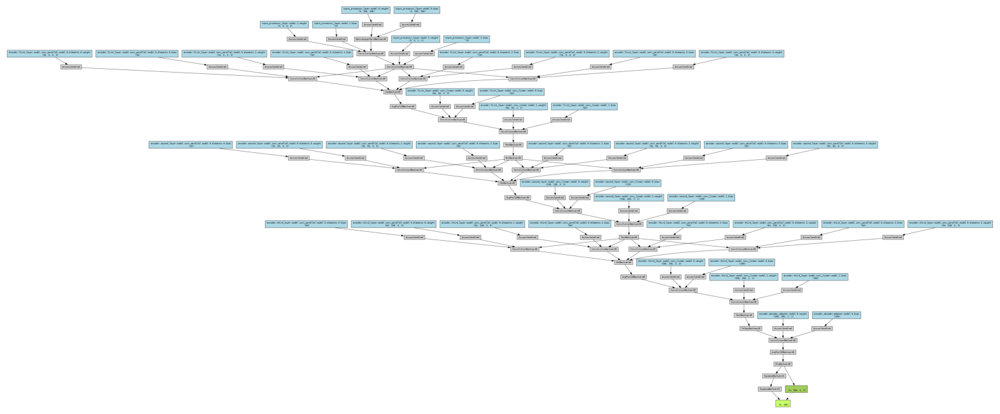

In [71]:
# input_processor = torch.nn.DataParallel(InputProcessor(), device_ids=[0, 1]).to(0)
# encoder = torch.nn.DataParallel(Encoder(), device_ids=[0, 1]).to(0)
# encoder_decoder_adapter = torch.nn.DataParallel(EncoderDecoderAdapter(), device_ids=[0, 1]).to(0)
# decoder = torch.nn.DataParallel(Decoder(), device_ids=[0, 1]).to(0)
input_processor = InputProcessor().to(1)
encoder = Encoder().to(1)
encoder_decoder_adapter = EncoderDecoderAdapter().to(0)
decoder = Decoder().to(0)
model = MyModel(
    input_processor_layer = input_processor,
    encoder = encoder,
    encoder_decoder_adapter = encoder_decoder_adapter,
    decoder = decoder,
)
batch = torch.randn(4,3,256,256)
y = model(batch.to(1))
print(y.shape)
plt.figure(figsize= (20, 40))
plt.axis('off')
make_dot(y, params=dict(list(model.named_parameters()))).render("model", format="png")
plt.imshow(Image.open('/kaggle/working/model.png'))

# My cnn + Aug + schedul

In [21]:
input_processor = InputProcessor().to(1)
encoder = Encoder().to(1)
encoder_decoder_adapter = EncoderDecoderAdapter().to(0)
decoder = Decoder().to(0)
net = MyModel(
    input_processor_layer = input_processor,
    encoder = encoder,
    encoder_decoder_adapter = encoder_decoder_adapter,
    decoder = decoder,
)
# torch.nn.init.kaiming_normal(encoder) 
# net = MyModel()
# net = net.to(0)
# net = torch.nn.DataParallel(net, device_ids=[0, 1])
# net = net.to(0)
x, y = train_dataset[0]
net(x.float().unsqueeze(0).to(1)).shape

torch.Size([1, 256])

In [22]:
criterion = NN.CrossEntropyLoss()
optimizer = optim.Adam(net.parameters(), lr=0.01)
scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lambda epoch: 0.01 * 0.999 ** epoch)
train_process = TrainResults('my_model__transfom__aug')

In [23]:
loss_m = []
valid_loss_mean = []
valid_loss = []

In [24]:
n_of_batches = 0
for e in tqdm(range(Parameters.epochs)):
  int_loss_m = []
  k = 0
  for xb, yb in train_dataloader:
    n_of_batches += 1
    outputs = net(xb.float().to(1))
    loss = criterion(outputs.to(0), yb.float().to(0))
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    loss_m.append(loss.item())
    train_process.train_losses.append(loss.item())
    int_loss_m.append(loss.item())
    if k > 50:
        break
    k += 1
  scheduler.step()
  if e % 10 == 0:
    with torch.no_grad():
        g = []
        for xb, yb in test_dataloader:
            outputs = net(xb.float().to(1))
            loss = criterion(outputs.to(0), yb.float().to(0))
            g.append(loss.item())
            train_process.test_losses.append(loss.item())
        valid_loss_mean.append(np.mean(g))
        valid_loss += g
    print(e, 'avg_loss=', np.mean(loss_m), 'last_loss = ', loss.item(), 'min_loss = ', np.min(loss_m))
    print(e, 'int_loss_m__mean = ', np.mean(int_loss_m), 'int_loss_m__min = ', np.min(int_loss_m))
    print(e, 'int_loss_m__mean = ', np.mean(valid_loss), 'int_loss_m__min = ', np.min(valid_loss))
print('END', 'avg_loss=', np.mean(loss_m), 'last_loss = ', loss.item(), 'min_loss = ', np.min(loss_m))
save_train_res(net, train_process)

  0%|          | 0/150 [00:11<?, ?it/s]


OutOfMemoryError: CUDA out of memory. Tried to allocate 8.00 GiB. GPU 1 has a total capacty of 14.75 GiB of which 5.09 GiB is free. Process 2187 has 9.65 GiB memory in use. Of the allocated memory 9.51 GiB is allocated by PyTorch, and 19.79 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

In [53]:
from sklearn.metrics import classification_report

In [29]:
y_p, y_t = [], []
for x_i, y_i in test_dataset:
    y_t.append(y_i.unsqueeze(0))
    y_p.append(net(x_i.float().unsqueeze(0).to(1)))
y_pred = torch.cat(y_p, 0)
y_true = torch.cat(y_t, 0)

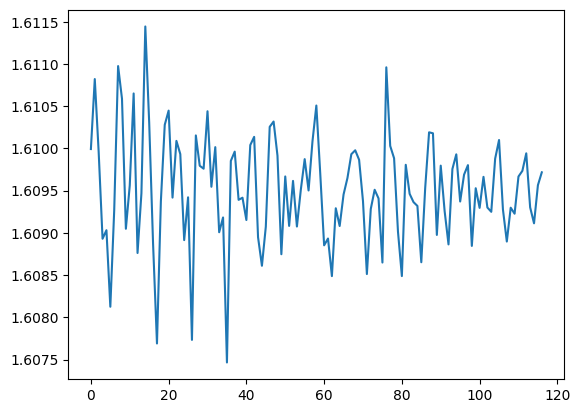

In [30]:
plt.plot(loss_m)

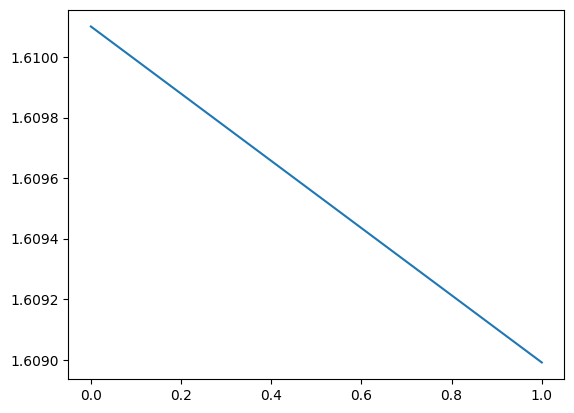

In [31]:
plt.plot(valid_loss_mean)

In [38]:
y_true.numpy()

tensor([0, 2, 1,  ..., 1, 3, 3])

In [32]:
print(classification_report(y_true.argmax(1).numpy(), y_pred.argmax(1).to('cpu').detach().numpy()))

              precision    recall  f1-score   support

           0       0.20      1.00      0.33       218
           1       0.00      0.00      0.00       217
           2       0.00      0.00      0.00       217
           3       0.00      0.00      0.00       218
           4       0.00      0.00      0.00       217

    accuracy                           0.20      1087
   macro avg       0.04      0.20      0.07      1087
weighted avg       0.04      0.20      0.07      1087



## My CNN + Aug

In [47]:
input_processor = InputProcessor().to(1)
encoder = Encoder().to(1)
encoder_decoder_adapter = EncoderDecoderAdapter().to(0)
decoder = Decoder().to(0)
net = MyModel(
    input_processor_layer = input_processor,
    encoder = encoder,
    encoder_decoder_adapter = encoder_decoder_adapter,
    decoder = decoder,
)
# net = MyModel()
# net = net.to(0)
# net = torch.nn.DataParallel(net, device_ids=[0, 1])
# net = net.to(0)
x, y = train_dataset[0]
net(x.float().unsqueeze(0).to(1)).shape

torch.Size([1, 5])

In [48]:
criterion = NN.MSELoss()
optimizer = optim.Adam(net.parameters(), lr=0.001)

In [29]:
train_process = TrainResults('my_model_transfom')

In [30]:
loss_m = []
valid_loss_mean = []
valid_loss = []

In [31]:
n_of_batches = 0
for e in tqdm(range(Parameters.epochs)):
  int_loss_m = []
  k = 0
  for xb, yb in train_dataloader:
    n_of_batches += 1
    outputs = net(xb.float().to(1))
    loss = criterion(outputs.to(0), yb.float().to(0))
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    loss_m.append(loss.item())
    train_process.train_losses.append(loss.item())
    int_loss_m.append(loss.item())
    if k > 50:
        break
    k += 1
  if e % 10 == 0:
    with torch.no_grad():
        g = []
        for xb, yb in test_dataloader:
            outputs = net(xb.float().to(1))
            loss = criterion(outputs.to(0), yb.float().to(0))
            g.append(loss.item())
            train_process.test_losses.append(loss.item())
        valid_loss_mean.append(np.mean(g))
        valid_loss += g
    print(e, 'avg_loss=', np.mean(loss_m), 'last_loss = ', loss.item(), 'min_loss = ', np.min(loss_m))
    print(e, 'int_loss_m__mean = ', np.mean(int_loss_m), 'int_loss_m__min = ', np.min(int_loss_m))
    print(e, 'int_loss_m__mean = ', np.mean(valid_loss), 'int_loss_m__min = ', np.min(valid_loss))
print('END', 'avg_loss=', np.mean(loss_m), 'last_loss = ', loss.item(), 'min_loss = ', np.min(loss_m))
save_train_res(net, train_process)

  0%|          | 1/300 [01:53<9:26:37, 113.70s/it]

0 avg_loss= 0.11663152869133388 last_loss =  0.12083247303962708 min_loss =  0.10804221779108047
0 int_loss_m__mean =  0.11663152869133388 int_loss_m__min =  0.10804221779108047
0 int_loss_m__mean =  0.1167005408141348 int_loss_m__min =  0.11295508593320847


  4%|▎         | 11/300 [18:54<8:25:18, 104.91s/it]

10 avg_loss= 0.11546908532154751 last_loss =  0.11704865843057632 min_loss =  0.10091717541217804
10 int_loss_m__mean =  0.11460278752972097 int_loss_m__min =  0.10286632925271988
10 int_loss_m__mean =  0.11547594972782665 int_loss_m__min =  0.10631324350833893


  7%|▋         | 21/300 [35:58<8:08:18, 105.01s/it]

20 avg_loss= 0.11500036611067814 last_loss =  0.11223777383565903 min_loss =  0.10091717541217804
20 int_loss_m__mean =  0.11445836372235242 int_loss_m__min =  0.1032506451010704
20 int_loss_m__mean =  0.11491090914717426 int_loss_m__min =  0.10631324350833893


 10%|█         | 31/300 [53:00<7:49:34, 104.74s/it]

30 avg_loss= 0.11472979773267171 last_loss =  0.11009936779737473 min_loss =  0.10091717541217804
30 int_loss_m__mean =  0.11438207218752187 int_loss_m__min =  0.10333575308322906
30 int_loss_m__mean =  0.1145822008450826 int_loss_m__min =  0.10631324350833893


 14%|█▎        | 41/300 [1:10:01<7:33:05, 104.96s/it]

40 avg_loss= 0.11448300060638396 last_loss =  0.1208028718829155 min_loss =  0.10033074766397476
40 int_loss_m__mean =  0.11317803907920332 int_loss_m__min =  0.10319321602582932
40 int_loss_m__mean =  0.11429232541057799 int_loss_m__min =  0.10436773300170898


 17%|█▋        | 51/300 [1:27:03<7:15:46, 105.01s/it]

50 avg_loss= 0.11377823011221358 last_loss =  0.11433325707912445 min_loss =  0.0954551100730896
50 int_loss_m__mean =  0.10935453807606417 int_loss_m__min =  0.10000542551279068
50 int_loss_m__mean =  0.11347057366812671 int_loss_m__min =  0.10221047699451447


 20%|██        | 61/300 [1:44:07<6:58:10, 104.98s/it]

60 avg_loss= 0.11291828841732576 last_loss =  0.10430137813091278 min_loss =  0.0954551100730896
60 int_loss_m__mean =  0.1075390781111577 int_loss_m__min =  0.09985999017953873
60 int_loss_m__mean =  0.11263463598868204 int_loss_m__min =  0.10221047699451447


 24%|██▎       | 71/300 [2:01:11<6:41:28, 105.19s/it]

70 avg_loss= 0.11208260034665453 last_loss =  0.10270527750253677 min_loss =  0.09220104664564133
70 int_loss_m__mean =  0.10618053902597989 int_loss_m__min =  0.09615104645490646
70 int_loss_m__mean =  0.11179989679820007 int_loss_m__min =  0.101106658577919


 27%|██▋       | 81/300 [2:18:14<6:23:11, 104.99s/it]

80 avg_loss= 0.11131359996056332 last_loss =  0.1003054603934288 min_loss =  0.09220104664564133
80 int_loss_m__mean =  0.10534966452156797 int_loss_m__min =  0.09549278765916824
80 int_loss_m__mean =  0.1111152356053576 int_loss_m__min =  0.1001695916056633


 30%|███       | 91/300 [2:35:17<6:05:09, 104.83s/it]

90 avg_loss= 0.11060246493144812 last_loss =  0.09391538798809052 min_loss =  0.09220104664564133
90 int_loss_m__mean =  0.10427109239732518 int_loss_m__min =  0.09668836742639542
90 int_loss_m__mean =  0.11038763117459086 int_loss_m__min =  0.09391538798809052


 34%|███▎      | 101/300 [2:52:21<5:49:15, 105.30s/it]

100 avg_loss= 0.10995088870017142 last_loss =  0.11453158408403397 min_loss =  0.086868517100811
100 int_loss_m__mean =  0.10403595229282099 int_loss_m__min =  0.09145957231521606
100 int_loss_m__mean =  0.10983474868716615 int_loss_m__min =  0.09391538798809052


 37%|███▋      | 111/300 [3:09:25<5:31:18, 105.18s/it]

110 avg_loss= 0.10933145937753154 last_loss =  0.09735456109046936 min_loss =  0.086868517100811
110 int_loss_m__mean =  0.10259416348793927 int_loss_m__min =  0.09542091935873032
110 int_loss_m__mean =  0.10922725533169729 int_loss_m__min =  0.09391538798809052


 40%|████      | 121/300 [3:26:30<5:13:36, 105.12s/it]

120 avg_loss= 0.108710692446601 last_loss =  0.09791385382413864 min_loss =  0.086868517100811
120 int_loss_m__mean =  0.10130818012882681 int_loss_m__min =  0.0943761020898819
120 int_loss_m__mean =  0.10863396136933921 int_loss_m__min =  0.09162744134664536


 44%|████▎     | 131/300 [3:43:34<4:55:58, 105.08s/it]

130 avg_loss= 0.1080747222102138 last_loss =  0.0972677543759346 min_loss =  0.086868517100811
130 int_loss_m__mean =  0.09943296059089549 int_loss_m__min =  0.0891072079539299
130 int_loss_m__mean =  0.10803545851792608 int_loss_m__min =  0.09162744134664536


 47%|████▋     | 141/300 [4:00:40<4:39:38, 105.52s/it]

140 avg_loss= 0.10742725905156851 last_loss =  0.10101988911628723 min_loss =  0.0849585086107254
140 int_loss_m__mean =  0.09855536634431165 int_loss_m__min =  0.08955522626638412
140 int_loss_m__mean =  0.1074673013554679 int_loss_m__min =  0.09162744134664536


 50%|█████     | 151/300 [4:17:45<4:20:33, 104.92s/it]

150 avg_loss= 0.10676527936425151 last_loss =  0.08766462653875351 min_loss =  0.0849585086107254
150 int_loss_m__mean =  0.09666694634977509 int_loss_m__min =  0.08688094466924667
150 int_loss_m__mean =  0.10677803752736913 int_loss_m__min =  0.08766462653875351


 54%|█████▎    | 161/300 [4:34:51<4:03:42, 105.20s/it]

160 avg_loss= 0.10610489593529553 last_loss =  0.08938659727573395 min_loss =  0.0849585086107254
160 int_loss_m__mean =  0.0959326033206547 int_loss_m__min =  0.08575423806905746
160 int_loss_m__mean =  0.10620775161420598 int_loss_m__min =  0.08766462653875351


 57%|█████▋    | 171/300 [4:51:55<3:46:07, 105.18s/it]

170 avg_loss= 0.10550231171056172 last_loss =  0.10861237347126007 min_loss =  0.08046272397041321
170 int_loss_m__mean =  0.09532227739691734 int_loss_m__min =  0.08575501292943954
170 int_loss_m__mean =  0.10571667970514592 int_loss_m__min =  0.08739682286977768


 60%|██████    | 181/300 [5:08:59<3:27:57, 104.85s/it]

180 avg_loss= 0.10493506023010768 last_loss =  0.0956185832619667 min_loss =  0.08046272397041321
180 int_loss_m__mean =  0.0950284155414385 int_loss_m__min =  0.08667421340942383
180 int_loss_m__mean =  0.10516141599033312 int_loss_m__min =  0.08739682286977768


 64%|██████▎   | 191/300 [5:26:05<3:11:33, 105.44s/it]

190 avg_loss= 0.10440619176521572 last_loss =  0.09013762325048447 min_loss =  0.08046272397041321
190 int_loss_m__mean =  0.09471437663716428 int_loss_m__min =  0.08608845621347427
190 int_loss_m__mean =  0.10467924239734809 int_loss_m__min =  0.08739682286977768


 67%|██████▋   | 201/300 [5:43:12<2:53:25, 105.11s/it]

200 avg_loss= 0.10391780095518874 last_loss =  0.09670401364564896 min_loss =  0.08046272397041321
200 int_loss_m__mean =  0.09447823399130036 int_loss_m__min =  0.0858750119805336
200 int_loss_m__mean =  0.1042465962587841 int_loss_m__min =  0.08739682286977768


 70%|███████   | 211/300 [6:00:15<2:35:43, 104.98s/it]

210 avg_loss= 0.1034642439860054 last_loss =  0.10067084431648254 min_loss =  0.07955938577651978
210 int_loss_m__mean =  0.09414289935546763 int_loss_m__min =  0.07955938577651978
210 int_loss_m__mean =  0.10385036976499991 int_loss_m__min =  0.08739682286977768


 74%|███████▎  | 221/300 [6:17:19<2:18:35, 105.26s/it]

220 avg_loss= 0.10303127245483229 last_loss =  0.08938116580247879 min_loss =  0.07955938577651978
220 int_loss_m__mean =  0.09376689353409935 int_loss_m__min =  0.08582713454961777
220 int_loss_m__mean =  0.103479095739155 int_loss_m__min =  0.08739682286977768


 77%|███████▋  | 231/300 [6:34:24<2:01:00, 105.23s/it]

230 avg_loss= 0.10263464173815741 last_loss =  0.08842692524194717 min_loss =  0.07955938577651978
230 int_loss_m__mean =  0.09372979775071144 int_loss_m__min =  0.08410808444023132
230 int_loss_m__mean =  0.10315719215820233 int_loss_m__min =  0.08739682286977768


 77%|███████▋  | 232/300 [6:37:08<1:56:24, 102.71s/it]


KeyboardInterrupt: 

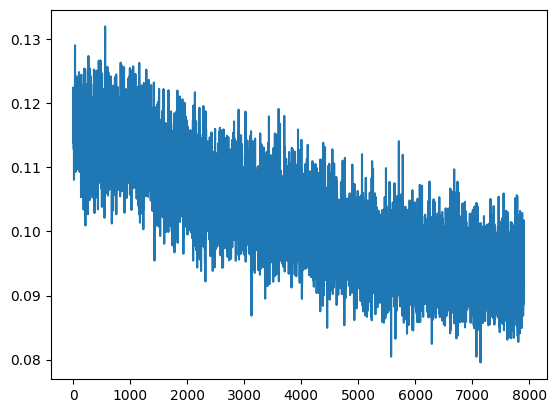

In [32]:
plt.plot(loss_m)

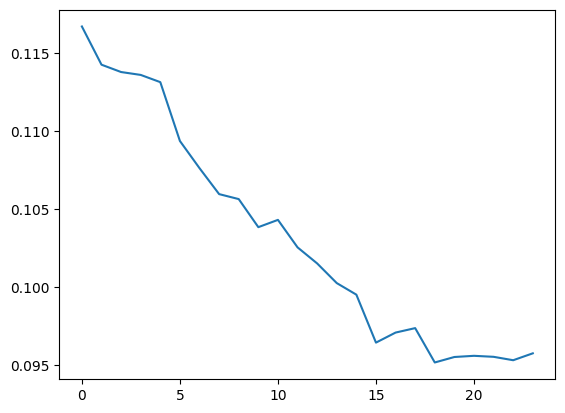

In [33]:
plt.plot(valid_loss_mean)

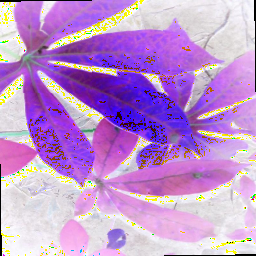

In [34]:
net(x.float().unsqueeze(0).to(1))
to_pil_image(x.float())

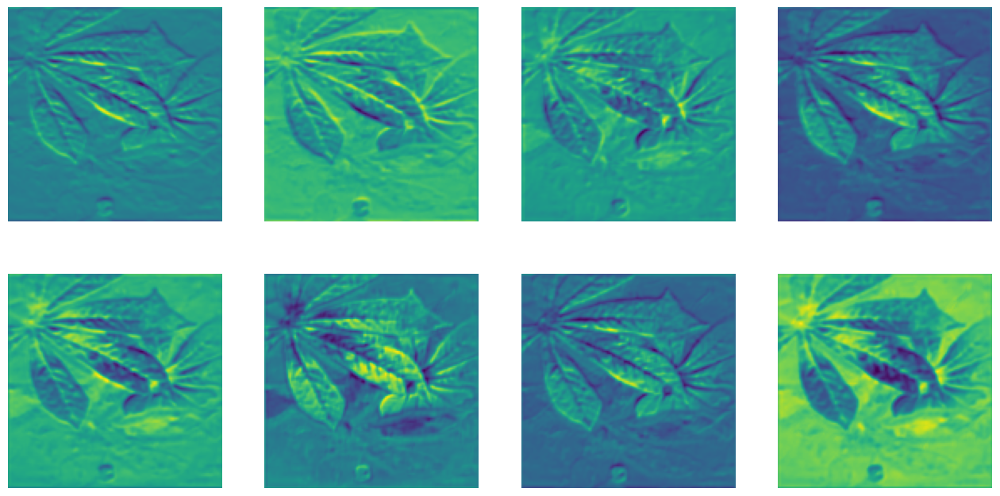

In [35]:
nc, nr = 2, 4
f, a = plt.subplots(nc, nr, figsize=(16, 8))
k = net.encoder.first_layer.last_activation.to('cpu')[0]
for i in range(len(k)):
    a[i//nr, i%nr].imshow(k[i])
    a[i//nr, i%nr].axis('off')

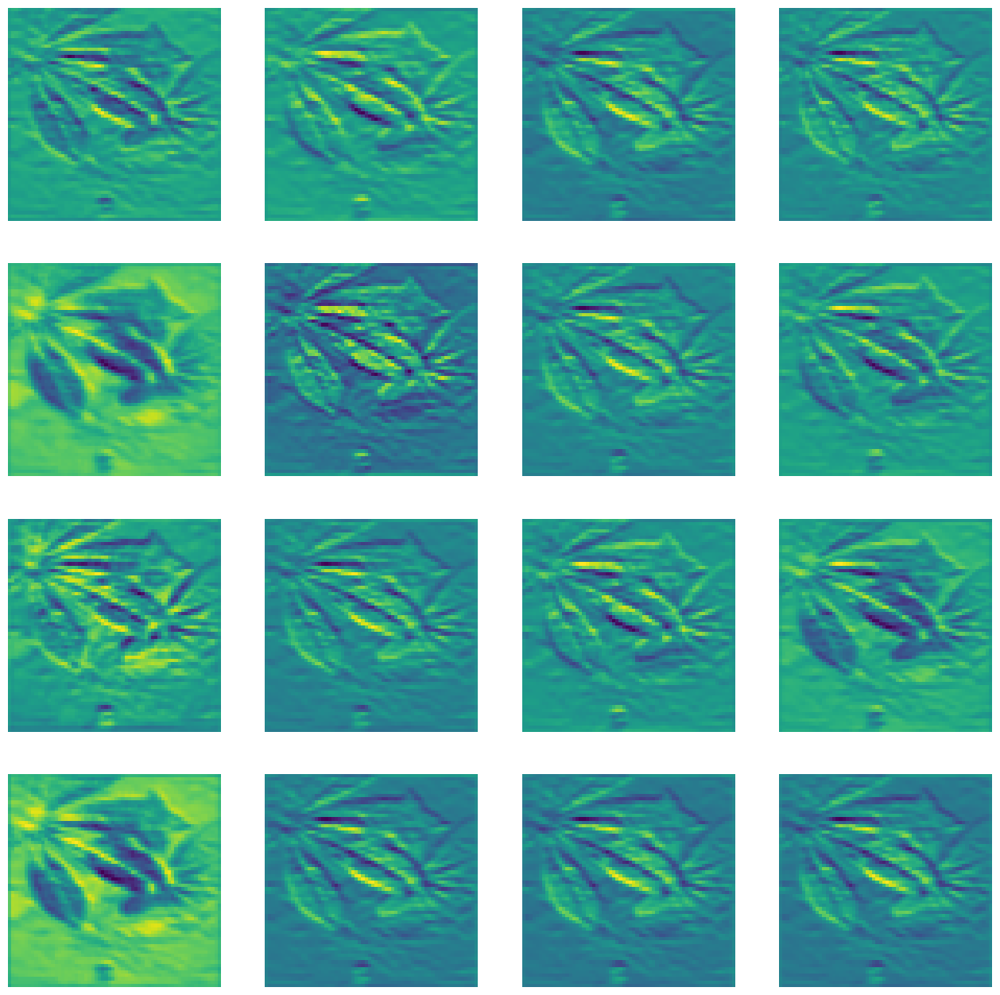

In [36]:
nc, nr = 4, 4
f, a = plt.subplots(nc, nr, figsize=(16, 16))
k = net.encoder.second_layer.last_activation[0]
for i in range(len(k)):
    a[i//nr, i%nr].imshow(k[i])
    a[i//nr, i%nr].axis('off')

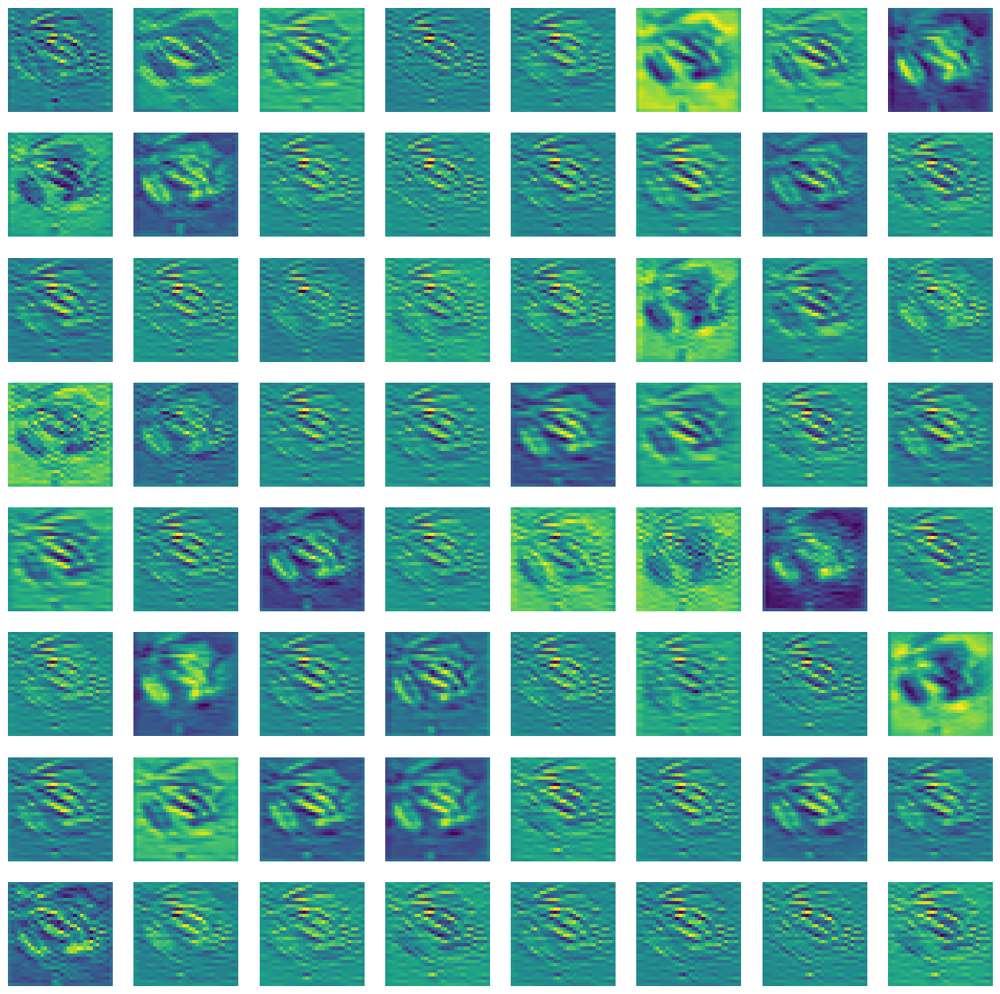

In [37]:
nc, nr = 8, 8
f, a = plt.subplots(nc, nr, figsize=(16, 16))
k = net.encoder.third_layer.last_activation[0]
# len(k)
for i in range(len(k)):
    a[i//nr, i%nr].imshow(k[i])
    a[i//nr, i%nr].axis('off')

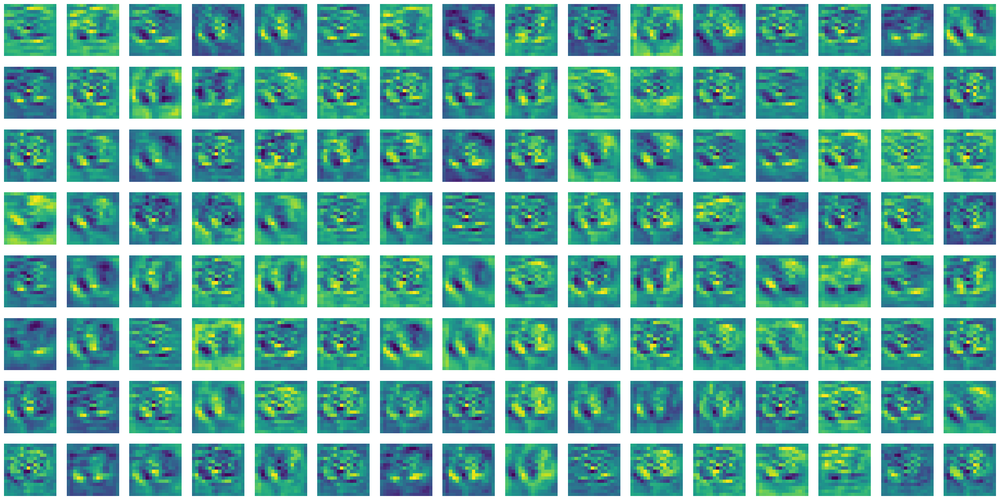

In [38]:
nc, nr = 8, 16
f, a = plt.subplots(nc, nr, figsize=(32, 16))
k = net.encoder.fourth_layer.last_activation[0]
# len(k)
for i in range(len(k)):
    a[i//nr, i%nr].imshow(k[i])
    a[i//nr, i%nr].axis('off')

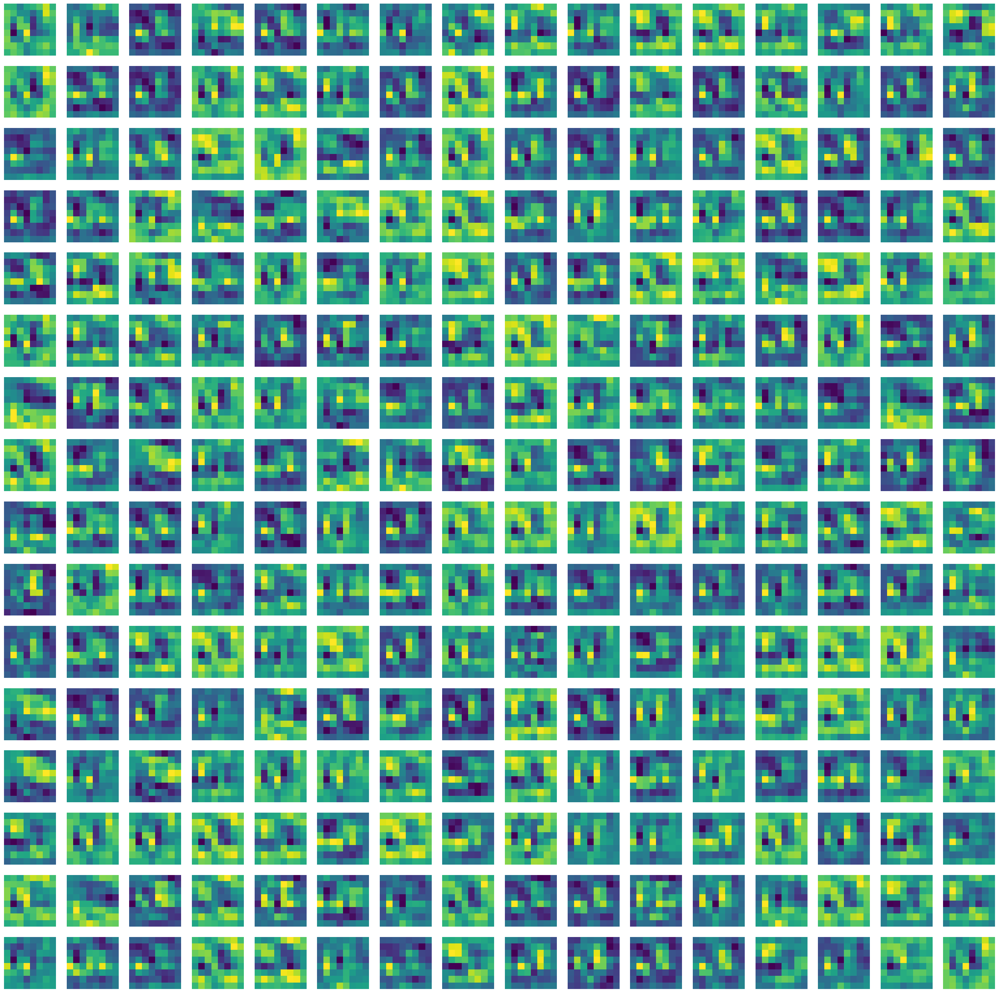

In [39]:
nc, nr = 16, 16
f, a = plt.subplots(nc, nr, figsize=(32, 32))
k = net.encoder.fiveth_layer.last_activation[0]
# len(k)
for i in range(len(k)):
    a[i//nr, i%nr].imshow(k[i])
    a[i//nr, i%nr].axis('off')

In [40]:
save_train_res(net, train_process)

# My CNN Only

# ResNet34 + Aug

In [16]:
rn34 = resnet34(pretrained=True)

for param in rn34.parameters():
    param.requires_grad = False
rn34

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [34]:
def weights_init(m):
    if isinstance(m, NN.Conv2d):
        torch.nn.init.xavier_uniform_(m.weight)
#         torch.nn.init.zero_(m.bias)

In [15]:
for i in rn34.layer4[2].parameters():
    i.requires_grad = True
rn34.fc = torch.nn.Sequential(
    torch.nn.Linear(512, 256),
    torch.nn.Tanh(),
    torch.nn.Linear(256,  128),
    torch.nn.Tanh(),
    torch.nn.Linear(128, 5),
    torch.nn.Softmax(1)
)
# for i in rn34.fc:
#     weights_init(i)
# rn34.conv1 = torch.nn.Sequential(
#     torch.nn.Conv2d(3, 4, kernel_size=(3, 3), padding=1),
#     torch.nn.AvgPool2d((2, 2)),
#     torch.nn.Conv2d(4, 8, kernel_size=(3, 3), padding=1),
#     torch.nn.AvgPool2d((2, 2)),
#     torch.nn.Conv2d(8, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
# )
# for i in rn34.conv1:
#     weights_init(i)
rn34 = rn34.to(0)


NameError: name 'rn34' is not defined

In [37]:
train_process = TrainResults('resnet34__transfom')

In [38]:
criterion = NN.MSELoss()
optimizer = optim.Adam(rn34.parameters(), lr=0.001)

In [39]:
loss_m = []
valid_loss_mean = []
valid_loss = []

In [40]:
for xb, yb in train_dataloader:
    break

In [66]:
with torch.no_grad():
    print(rn34(xb.to(0).float()).shape)

torch.Size([512, 5])


In [41]:
n_of_batches = 0
for e in tqdm(range(Parameters.epochs)):
  int_loss_m = []
  k = 0
  for xb, yb in train_dataloader:
    n_of_batches += 1
    outputs = rn34(xb.float().to(0))
    loss = criterion(outputs.to(0), yb.float().to(0))
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    loss_m.append(loss.item())
    train_process.train_losses.append(loss.item())
    int_loss_m.append(loss.item())
    if k > 50:
        break
    k += 1
  if e % 10 == 0:
    with torch.no_grad():
        g = []
        for xb, yb in test_dataloader:
            outputs = rn34(xb.float().to(0))
            loss = criterion(outputs.to(0), yb.float().to(0))
            g.append(loss.item())
            train_process.test_losses.append(loss.item())
        valid_loss_mean.append(np.mean(g))
        valid_loss += g
    print(e, 'avg_loss=', np.mean(loss_m), 'last_loss = ', loss.item(), 'min_loss = ', np.min(loss_m))
    print(e, 'int_loss_m__mean = ', np.mean(int_loss_m), 'int_loss_m__min = ', np.min(int_loss_m))
    print(e, 'int_loss_m__mean = ', np.mean(valid_loss), 'int_loss_m__min = ', np.min(valid_loss))
print('END', 'avg_loss=', np.mean(loss_m), 'last_loss = ', loss.item(), 'min_loss = ', np.min(loss_m))
save_train_res(rn34, train_process)

  1%|          | 1/150 [00:30<1:14:50, 30.14s/it]

0 avg_loss= 0.12734414488077164 last_loss =  0.1091725304722786 min_loss =  0.09399447590112686
0 int_loss_m__mean =  0.12734414488077164 int_loss_m__min =  0.09399447590112686
0 int_loss_m__mean =  0.11162173002958298 int_loss_m__min =  0.10835859924554825


  7%|▋         | 11/150 [04:47<1:01:57, 26.74s/it]

10 avg_loss= 0.09670102262135707 last_loss =  0.11512956023216248 min_loss =  0.07407552748918533
10 int_loss_m__mean =  0.0839486539363861 int_loss_m__min =  0.07407552748918533
10 int_loss_m__mean =  0.10897280555218458 int_loss_m__min =  0.10245668888092041


 14%|█▍        | 21/150 [09:06<57:26, 26.72s/it]  

20 avg_loss= 0.08751820517437799 last_loss =  0.11358454078435898 min_loss =  0.05061745643615723
20 int_loss_m__mean =  0.07205018599828085 int_loss_m__min =  0.06520040333271027
20 int_loss_m__mean =  0.10726676881313324 int_loss_m__min =  0.09806539863348007


 21%|██        | 31/150 [13:25<53:07, 26.79s/it]

30 avg_loss= 0.0810482436771034 last_loss =  0.11250882595777512 min_loss =  0.046340346336364746
30 int_loss_m__mean =  0.06321991930405299 int_loss_m__min =  0.05300196632742882
30 int_loss_m__mean =  0.10735540790483356 int_loss_m__min =  0.09806539863348007


 27%|██▋       | 41/150 [17:43<48:20, 26.61s/it]

40 avg_loss= 0.07589264612614624 last_loss =  0.10981252044439316 min_loss =  0.04614952579140663
40 int_loss_m__mean =  0.05532207911213239 int_loss_m__min =  0.04803720861673355
40 int_loss_m__mean =  0.10790713764727115 int_loss_m__min =  0.09806539863348007


 34%|███▍      | 51/150 [22:00<44:02, 26.69s/it]

50 avg_loss= 0.07148914695078251 last_loss =  0.10242246836423874 min_loss =  0.040283430367708206
50 int_loss_m__mean =  0.050326295445362726 int_loss_m__min =  0.043721068650484085
50 int_loss_m__mean =  0.10909107544769843 int_loss_m__min =  0.09806539863348007


 34%|███▍      | 51/150 [22:07<42:57, 26.04s/it]


KeyboardInterrupt: 

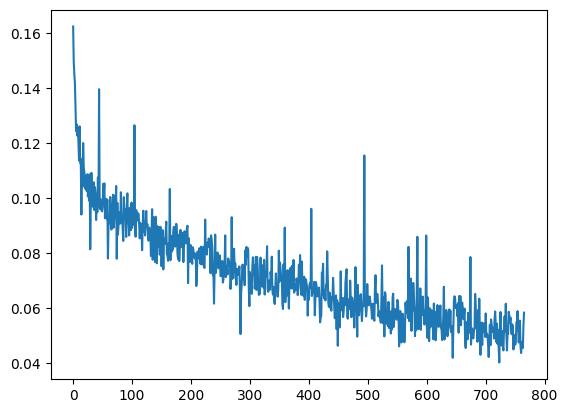

In [42]:
plt.plot(loss_m)

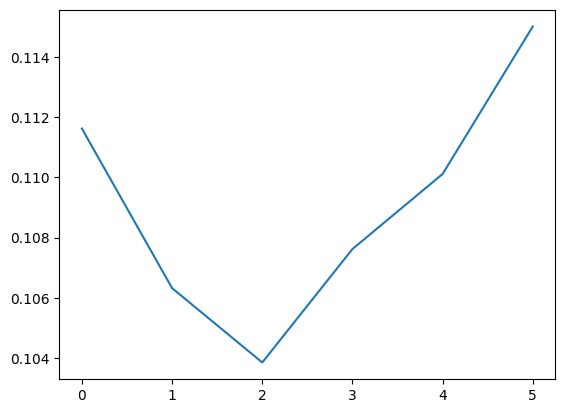

In [43]:
plt.plot(valid_loss_mean)

In [44]:
for x, y in test_dataset:
    break

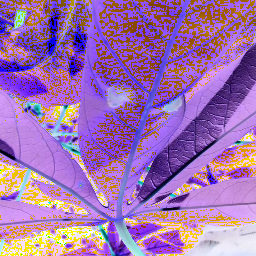

In [72]:
# rn34(x.float().unsqueeze(0).to(1))
to_pil_image(x.float())

In [73]:
c1 = rn34.conv1(x.float().unsqueeze(0).to(0))
bn1 = rn34.bn1(c1)
relu = rn34.relu(bn1)
maxpool = rn34.maxpool(relu)
layer1 = rn34.layer1(maxpool)
layer2 = rn34.layer2(layer1)
layer3 = rn34.layer3(layer2)
layer4 = rn34.layer4(layer3)

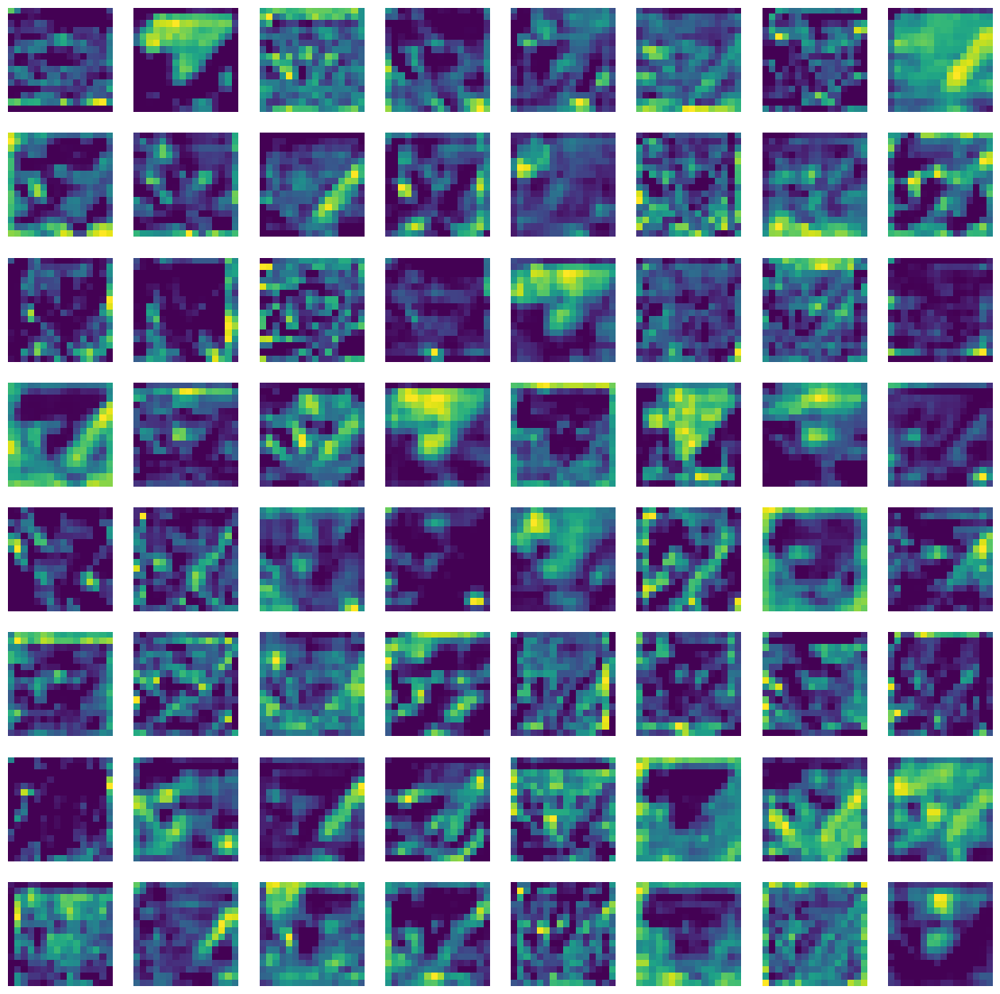

In [74]:
nc, nr = 8, 8
f, a = plt.subplots(nc, nr, figsize=(16, 16))
k = layer1.squeeze().to('cpu').detach()
# len(k)
for i in range(len(k)):
    a[i//nr, i%nr].imshow(k[i])
    a[i//nr, i%nr].axis('off')

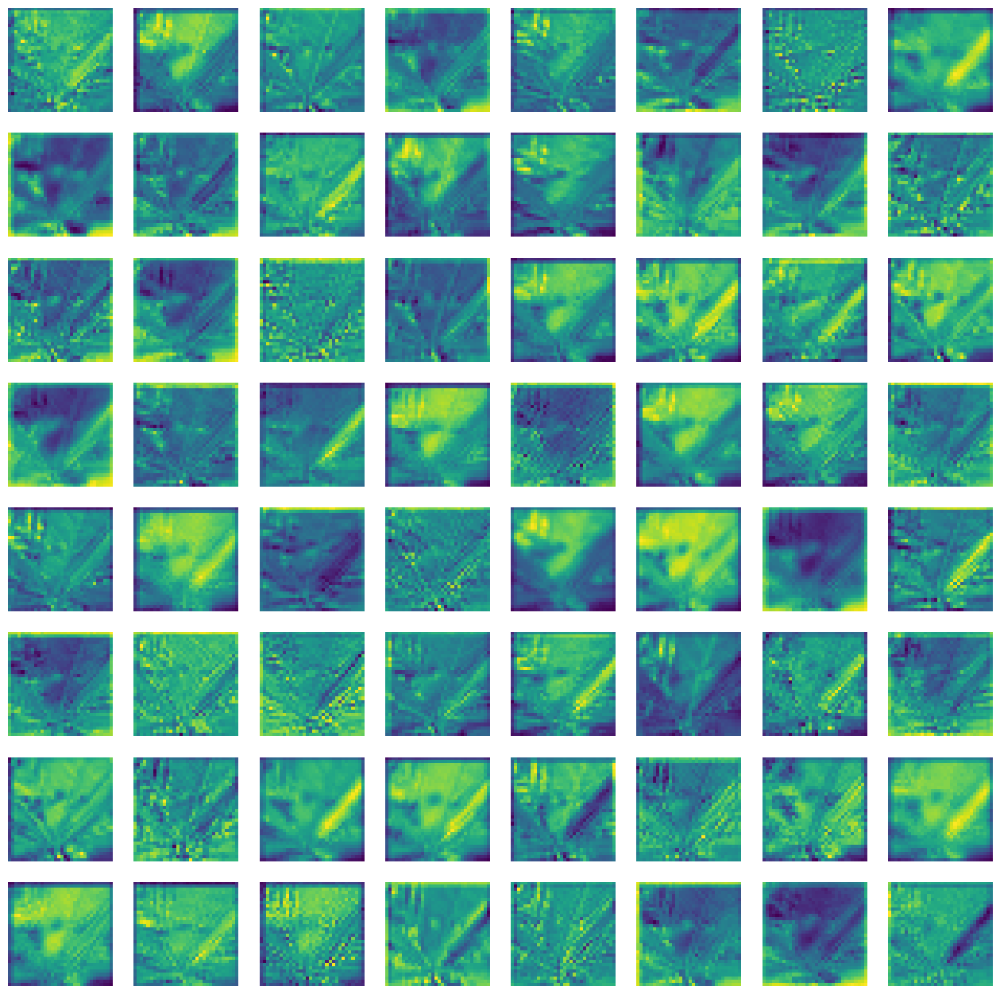

In [75]:
nc, nr = 8, 8
f, a = plt.subplots(nc, nr, figsize=(16, 16))
k = c1.squeeze().to('cpu').detach()
# len(k)
for i in range(len(k)):
    a[i//nr, i%nr].imshow(k[i])
    a[i//nr, i%nr].axis('off')

In [45]:
save_train_res(rn34, train_process)

In [57]:
rn34 = rn34.to('cpu')

In [58]:
torch.cuda.empty_cache()

In [60]:
with torch.no_grad():
    y_p, y_t = [], []
    for x_i, y_i in test_dataset:
        y_t.append(y_i.unsqueeze(0))
        y_p.append(x_i.float().unsqueeze(0))
    y_pred = rn34(torch.cat(y_p, 0).to('cpu'))
    y_true = torch.cat(y_t, 0)

KeyboardInterrupt: 

In [ ]:
from sklearn.metrics import accuracy_score

In [ ]:
print(accuracy_score(y_true.argmax(1).numpy(), y_pred.argmax(1).to('cpu').detach().numpy()))

In [126]:
print(classification_report(y_true.argmax(1).numpy(), y_pred.argmax(1).to('cpu').detach().numpy()))

              precision    recall  f1-score   support

           0       0.40      0.39      0.40       218
           1       0.33      0.36      0.35       217
           2       0.37      0.45      0.41       217
           3       0.47      0.47      0.47       218
           4       0.34      0.25      0.29       217

    accuracy                           0.39      1087
   macro avg       0.38      0.39      0.38      1087
weighted avg       0.38      0.39      0.38      1087



In [ ]:
with torch.no_grad():
    y_p, y_t = [], []
    for x_i, y_i in train_dataset:
        y_t.append(y_i.unsqueeze(0))
        y_p.append(x_i.float().unsqueeze(0))
    y_pred = rn34(torch.cat(y_p, 0).to('cpu'))
    y_true = torch.cat(y_t, 0)

In [91]:
print(classification_report(y_true.argmax(1).numpy(), y_pred.argmax(1).to('cpu').detach().numpy()))

              precision    recall  f1-score   support

           0       0.79      0.78      0.78       869
           1       0.74      0.78      0.76       870
           2       0.63      0.73      0.68       870
           3       0.74      0.72      0.73       869
           4       0.73      0.62      0.67       870

    accuracy                           0.72      4348
   macro avg       0.73      0.72      0.72      4348
weighted avg       0.73      0.72      0.72      4348



Получили перетрен

## Vgg + AUG + scheduler

In [98]:
torch.cuda.empty_cache()

In [14]:
vgg = torch.hub.load('pytorch/vision:v0.10.0', 'vgg19', pretrained=True)
vgg

Downloading: "https://github.com/pytorch/vision/zipball/v0.10.0" to /root/.cache/torch/hub/v0.10.0.zip
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:03<00:00, 172MB/s]  


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

In [15]:
for i in vgg.parameters():
    i.requires_grad = False
vgg.classifier = torch.nn.Sequential(
    torch.nn.Linear(25088, 4096),
    torch.nn.Tanh(),
    torch.nn.Linear(4096, 1024),
    torch.nn.Tanh(),
    torch.nn.Linear(1024,  256),
    torch.nn.Tanh(),
    torch.nn.Linear(256, 5),
    torch.nn.Softmax(1)
)
# vgg.features[0] = torch.nn.Sequential(
#     torch.nn.Conv2d(3, 4, kernel_size=(3, 3), padding=1),
#     torch.nn.AvgPool2d((2, 2)),
#     torch.nn.Conv2d(4, 8, kernel_size=(3, 3), padding=1),
#     torch.nn.AvgPool2d((2, 2)),
#     torch.nn.Conv2d(8, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
# )
vgg = vgg.to(0)

In [16]:
train_process = TrainResults('vgg__transfom_scheduler')

In [17]:
criterion = NN.CrossEntropyLoss()
optimizer = optim.Adam(vgg.parameters(), lr=0.001)
scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lambda epoch: 0.001 * 0.95 ** epoch)

In [18]:
for xb, yb in train_dataloader:
    break
with torch.no_grad():
    print(vgg(xb.to(0).float()).shape)

torch.Size([256, 5])


In [21]:
loss_m = []
valid_loss_mean = []
valid_loss = []

In [22]:
n_of_batches = 0
for e in tqdm(range(Parameters.epochs)):
  int_loss_m = []
  k = 0
  for xb, yb in train_dataloader:
    n_of_batches += 1
    outputs = vgg(xb.float().to(0))
    loss = criterion(outputs.to(0), yb.float().to(0))
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    loss_m.append(loss.item())
    train_process.train_losses.append(loss.item())
    int_loss_m.append(loss.item())
    if k > 50:
        break
    k += 1
  scheduler.step()
  if e % 10 == 0:
    with torch.no_grad():
        g = []
        for xb, yb in test_dataloader:
            outputs = vgg(xb.float().to(0))
            loss = criterion(outputs.to(0), yb.float().to(0))
            g.append(loss.item())
            train_process.test_losses.append(loss.item())
        valid_loss_mean.append(np.mean(g))
        valid_loss += g
    print(e, 'avg_loss=', np.mean(loss_m), 'last_loss = ', loss.item(), 'min_loss = ', np.min(loss_m))
    print(e, 'int_loss_m__mean = ', np.mean(int_loss_m), 'int_loss_m__min = ', np.min(int_loss_m))
    print(e, 'int_loss_m__mean = ', np.mean(valid_loss), 'int_loss_m__min = ', np.min(valid_loss))
print('END', 'avg_loss=', np.mean(loss_m), 'last_loss = ', loss.item(), 'min_loss = ', np.min(loss_m))
save_train_res(vgg, train_process)

  1%|          | 1/150 [01:16<3:09:24, 76.27s/it]

0 avg_loss= 1.596786647007383 last_loss =  1.6304559707641602 min_loss =  1.5864715576171875
0 int_loss_m__mean =  1.596786647007383 int_loss_m__min =  1.5864715576171875
0 int_loss_m__mean =  1.5928986221551895 int_loss_m__min =  1.5822632312774658


  7%|▋         | 11/150 [12:25<2:42:48, 70.27s/it]

10 avg_loss= 1.5528124514792032 last_loss =  1.524686336517334 min_loss =  1.4824483394622803
10 int_loss_m__mean =  1.5273570110057961 int_loss_m__min =  1.4948358535766602
10 int_loss_m__mean =  1.5585600137710571 int_loss_m__min =  1.517636775970459


 14%|█▍        | 21/150 [23:35<2:31:08, 70.30s/it]

20 avg_loss= 1.5343529741556579 last_loss =  1.4524788856506348 min_loss =  1.4585437774658203
20 int_loss_m__mean =  1.5055236446446385 int_loss_m__min =  1.4585437774658203
20 int_loss_m__mean =  1.538392797112465 int_loss_m__min =  1.4524788856506348


 21%|██        | 31/150 [34:47<2:19:37, 70.40s/it]

30 avg_loss= 1.523960068440676 last_loss =  1.3490403890609741 min_loss =  1.395493507385254
30 int_loss_m__mean =  1.498358364762931 int_loss_m__min =  1.4329952001571655
30 int_loss_m__mean =  1.5234735384583473 int_loss_m__min =  1.3490403890609741


 27%|██▋       | 41/150 [45:59<2:08:15, 70.60s/it]

40 avg_loss= 1.5172356191655987 last_loss =  1.4981423616409302 min_loss =  1.395493507385254
40 int_loss_m__mean =  1.494804674181445 int_loss_m__min =  1.4726938009262085
40 int_loss_m__mean =  1.5173361271619796 int_loss_m__min =  1.3490403890609741


 34%|███▍      | 51/150 [57:10<1:56:05, 70.36s/it]

50 avg_loss= 1.5122772846131651 last_loss =  1.3855873346328735 min_loss =  1.3782988786697388
50 int_loss_m__mean =  1.4905052185058594 int_loss_m__min =  1.4425132274627686
50 int_loss_m__mean =  1.51060089468956 int_loss_m__min =  1.3490403890609741


 41%|████      | 61/150 [1:08:23<1:44:39, 70.56s/it]

60 avg_loss= 1.5087263440600622 last_loss =  1.4824297428131104 min_loss =  1.3782988786697388
60 int_loss_m__mean =  1.4908975033924496 int_loss_m__min =  1.4587639570236206
60 int_loss_m__mean =  1.5073024502822332 int_loss_m__min =  1.3490403890609741


 47%|████▋     | 71/150 [1:19:37<1:33:09, 70.76s/it]

70 avg_loss= 1.5060914486226902 last_loss =  1.5835766792297363 min_loss =  1.3782988786697388
70 int_loss_m__mean =  1.4883782822510292 int_loss_m__min =  1.4534063339233398
70 int_loss_m__mean =  1.5062729623168707 int_loss_m__min =  1.3490403890609741


 54%|█████▍    | 81/150 [1:30:52<1:21:11, 70.60s/it]

80 avg_loss= 1.5038788133907846 last_loss =  1.5315897464752197 min_loss =  1.3782988786697388
80 int_loss_m__mean =  1.4892820119857788 int_loss_m__min =  1.4506845474243164
80 int_loss_m__mean =  1.5047325442234676 int_loss_m__min =  1.3490403890609741


 61%|██████    | 91/150 [1:42:05<1:09:27, 70.64s/it]

90 avg_loss= 1.5021993825272115 last_loss =  1.4956443309783936 min_loss =  1.3782988786697388
90 int_loss_m__mean =  1.4886341999317039 int_loss_m__min =  1.4666205644607544
90 int_loss_m__mean =  1.5030372798442841 int_loss_m__min =  1.3490403890609741


 63%|██████▎   | 94/150 [1:45:39<1:02:56, 67.44s/it]


KeyboardInterrupt: 

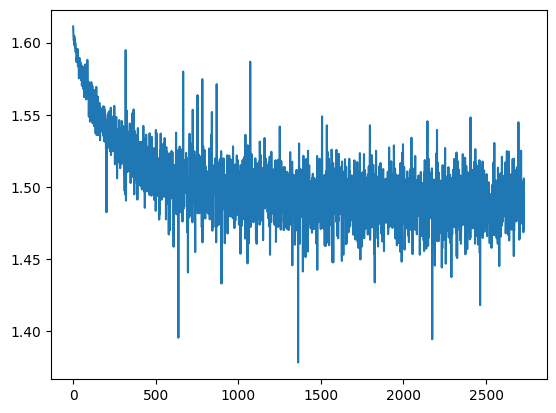

In [23]:
plt.plot(loss_m)

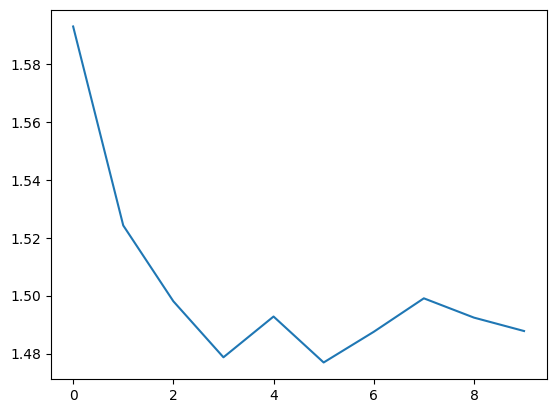

In [24]:
plt.plot(valid_loss_mean)

In [25]:
for x, y in test_dataset:
    break

In [26]:
vgg

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

In [27]:
l1 = vgg.features[0](x.float().unsqueeze(0).to(0))
l2 = vgg.features[0:6](x.float().unsqueeze(0).to(0))
l3 = vgg.features[0:10](x.float().unsqueeze(0).to(0))
l4 = vgg.features[0:15](x.float().unsqueeze(0).to(0))


In [28]:
l3.shape

torch.Size([1, 128, 64, 64])

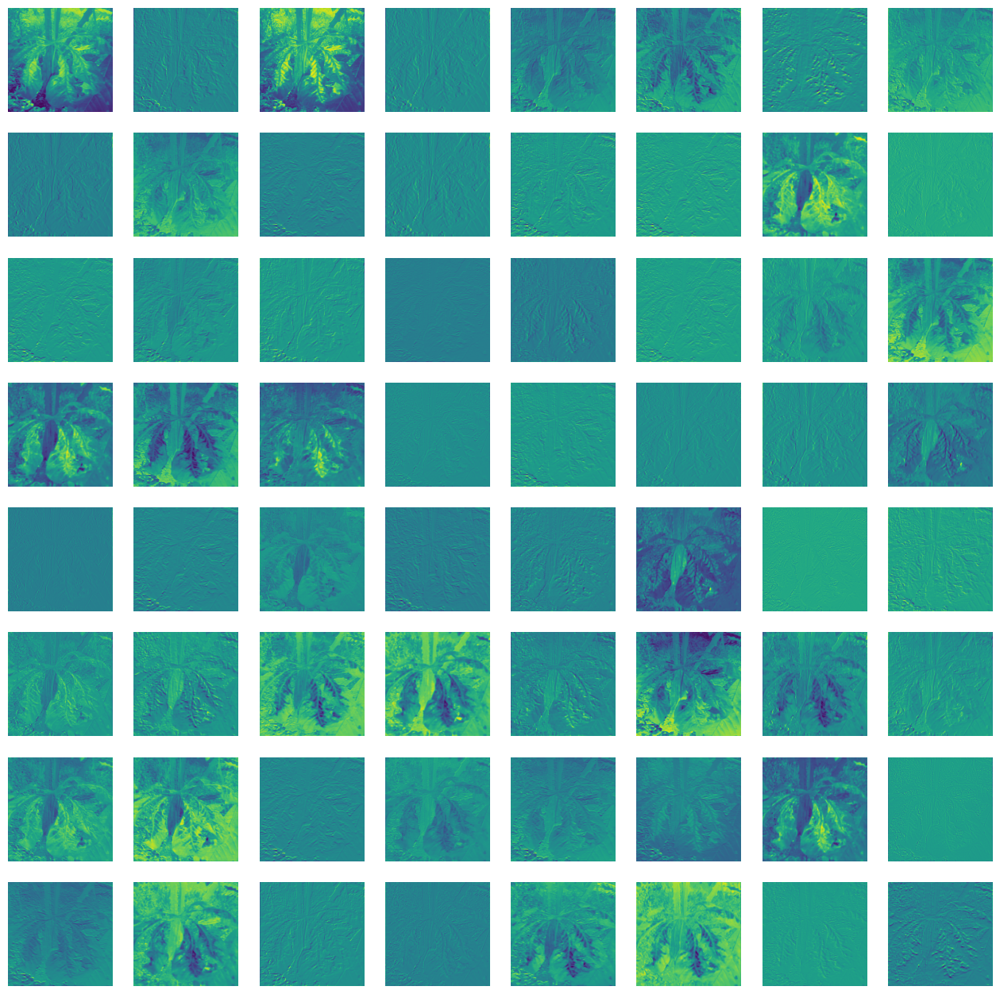

In [29]:
nc, nr = 8, 8
f, a = plt.subplots(nc, nr, figsize=(16, 16))
k = l1.squeeze().to('cpu').detach()
# len(k)
for i in range(len(k)):
    a[i//nr, i%nr].imshow(k[i])
    a[i//nr, i%nr].axis('off')

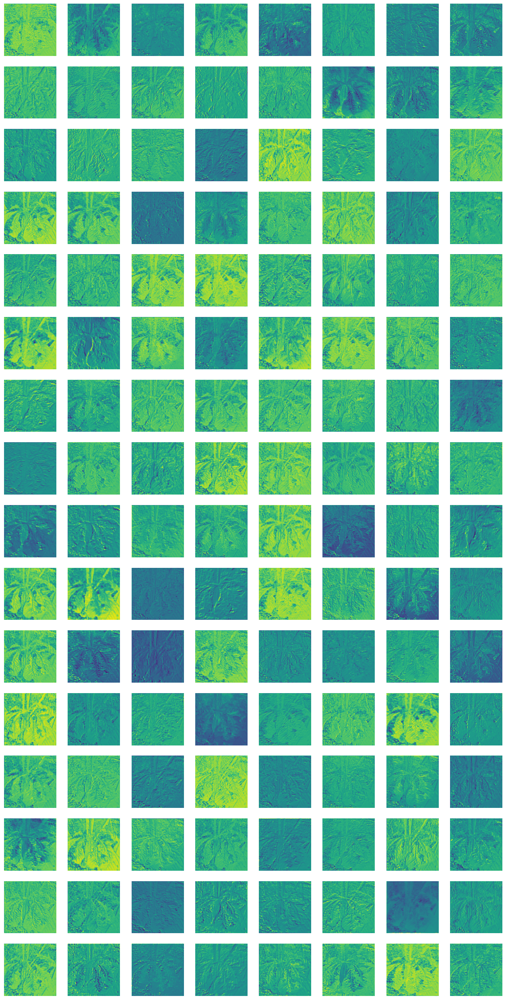

In [30]:
nc, nr = 16, 8
f, a = plt.subplots(nc, nr, figsize=(16, 32))
k = l2.squeeze().to('cpu').detach()
# len(k)
for i in range(len(k)):
    a[i//nr, i%nr].imshow(k[i])
    a[i//nr, i%nr].axis('off')

In [111]:
torch.cuda.empty_cache()

In [37]:
with torch.no_grad():
    vgg = vgg.to(1)
    y_p, y_t = [], []
    for x_i, y_i in test_dataset:
        y_t.append(y_i.unsqueeze(0))
        y_p.append(vgg(x_i.float().unsqueeze(0).to(1)))
    y_pred = torch.cat(y_p, 0)
    y_true = torch.cat(y_t, 0)
print(classification_report(y_true.argmax(1).numpy(), y_pred.argmax(1).to('cpu').detach().numpy()))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       200
           1       0.43      0.61      0.50       400
           2       0.40      0.42      0.41       400
           3       0.53      0.49      0.51       400
           4       0.41      0.46      0.43       400

    accuracy                           0.44      1800
   macro avg       0.35      0.39      0.37      1800
weighted avg       0.39      0.44      0.41      1800



In [38]:
save_train_res(vgg, train_process)